In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

### Taking a look at the Data that is the New York Collisions data

In [6]:
data = pd.read_csv('NYC_Collisions.csv', delimiter='\t')
data.head()

,Collision ID,Date,Time,Borough,Street Name,Cross Street,Latitude,Longitude,Contributing Factor,Vehicle Type,Persons Injured,Persons Killed,Pedestrians Injured,Pedestrians Killed,Cyclists Injured,Cyclists Killed,Motorists Injured,Motorists Killed
0,4491746,01-01-2021,20:00:00,Bronx,Bruckner Expressway,NaN,40.83398,-73.826350,Pavement Slippery,Passenger Vehicle,0.0,0,0,0,0,0,0,0
1,4441905,01-01-2021,05:28:00,Brooklyn,Lafayette Avenue,NaN,40.68730,-73.973656,Unspecified,Passenger Vehicle,0.0,0,0,0,0,0,0,0
2,4382769,01-01-2021,06:00:00,Staten Island,West Shore Expressway,NaN,NaN,NaN,Fell Asleep,Passenger Vehicle,0.0,0,0,0,0,0,0,0
3,4380949,01-01-2021,19:30:00,Bronx,Sedgwick Avenue,Vancortlandt Avenue West,40.88270,-73.892730,NaN,Not Reported,0.0,0,0,0,0,0,0,0
4,4380940,01-01-2021,07:40:00,Brooklyn,Cortelyou Road,Mc Donald Avenue,40.63791,-73.978640,Unspecified,Passenger Vehicle,0.0,0,0,0,0,0,0,0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238421 entries, 0 to 238420
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Collision ID         238421 non-null  int64  
 1   Date                 238421 non-null  object 
 2   Time                 238421 non-null  object 
 3   Borough              231224 non-null  object 
 4   Street Name          238058 non-null  object 
 5   Cross Street         111291 non-null  object 
 6   Latitude             216098 non-null  float64
 7   Longitude            216098 non-null  float64
 8   Contributing Factor  237134 non-null  object 
 9   Vehicle Type         238421 non-null  object 
 10  Persons Injured      238420 non-null  float64
 11  Persons Killed       238421 non-null  int64  
 12  Pedestrians Injured  238421 non-null  int64  
 13  Pedestrians Killed   238421 non-null  int64  
 14  Cyclists Injured     238421 non-null  int64  
 15  Cyclists Killed  

### Checking how many missing data points we have

In [8]:
missing_val_count = data.isnull().sum()
data.isnull().sum()

Collision ID                0
Date                        0
Time                        0
Borough                  7197
Street Name               363
Cross Street           127130
Latitude                22323
Longitude               22323
Contributing Factor      1287
Vehicle Type                0
Persons Injured             1
Persons Killed              0
Pedestrians Injured         0
Pedestrians Killed          0
Cyclists Injured            0
Cyclists Killed             0
Motorists Injured           0
Motorists Killed            0
dtype: int64

In [9]:
total_cells = np.product(data.shape)
total_missing = missing_val_count.sum()
print("Percent of missing values :", 
      round((total_missing/total_cells)*100, 2),'%')

Percent of missing values : 4.21 %


<Axes: >

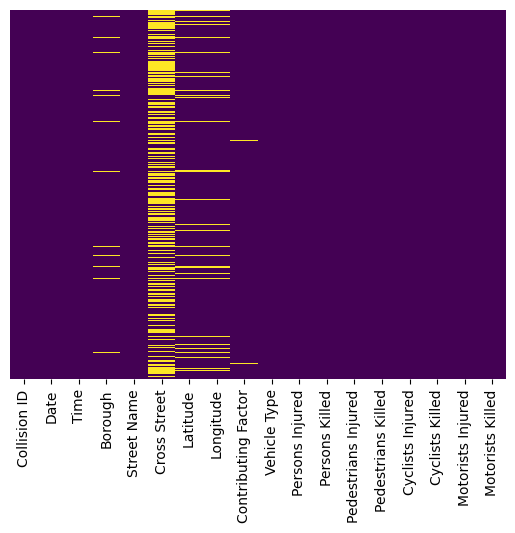

In [6]:
sns.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='viridis')


### Which columns have missing data

In [7]:
data[['Borough', 'Street Name', 'Cross Street', 'Latitude',
      'Longitude', 'Contributing Factor', 'Persons Injured']].isnull().sum()

Borough                  7197
Street Name               363
Cross Street           127130
Latitude                22323
Longitude               22323
Contributing Factor      1287
Persons Injured             1
dtype: int64

In [10]:
#Making a Copy of the data
df_copy = data

### Filling in missing Values in column 'Contributing Factor'

In [11]:
df_copy['Contributing Factor'].fillna('Unspecified', inplace = True)
df_copy

,Collision ID,Date,Time,Borough,Street Name,Cross Street,Latitude,Longitude,Contributing Factor,Vehicle Type,Persons Injured,Persons Killed,Pedestrians Injured,Pedestrians Killed,Cyclists Injured,Cyclists Killed,Motorists Injured,Motorists Killed
0,4491746,01-01-2021,20:00:00,Bronx,Bruckner Expressway,NaN,40.833980,-73.826350,Pavement Slippery,Passenger Vehicle,0.0,0,0,0,0,0,0,0
1,4441905,01-01-2021,05:28:00,Brooklyn,Lafayette Avenue,NaN,40.687300,-73.973656,Unspecified,Passenger Vehicle,0.0,0,0,0,0,0,0,0
2,4382769,01-01-2021,06:00:00,Staten Island,West Shore Expressway,NaN,NaN,NaN,Fell Asleep,Passenger Vehicle,0.0,0,0,0,0,0,0,0
3,4380949,01-01-2021,19:30:00,Bronx,Sedgwick Avenue,Vancortlandt Avenue West,40.882700,-73.892730,Unspecified,Not Reported,0.0,0,0,0,0,0,0,0
4,4380940,01-01-2021,07:40:00,Brooklyn,Cortelyou Road,Mc Donald Avenue,40.637910,-73.978640,Unspecified,Passenger Vehicle,0.0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238416,4619581,09-04-2023,04:21:00,Brooklyn,Meeker Avenue,NaN,40.715443,-73.951850,Failure to Yield Right-of-Way,Not Reported,1.0,0,1,0,0,0,0,0
238417,4619685,09-04-2023,08:30:00,Queens,Elbertson Street,Elmhurst Avenue,40.746864,-73.877170,Backing Unsafely,Passenger Vehicle,1.0,0,1,0,0,0,0,0
238418,4619519,09-04-2023,21:19:00,Brooklyn,Cortelyou Road,East 17 Street,40.642017,-73.962660,Unspecified,Passenger Vehicle,1.0,0,1,0,0,0,0,0
238419,4619921,09-04-2023,11:00:00,Manhattan,West 50 Street,NaN,40.763790,-73.989655,Driver Inattention/Distraction,Transport,0.0,0,0,0,0,0,0,0


### Converting 'Date' and 'Time' to datetime

In [12]:

df_copy['Date'] = pd.to_datetime(df_copy['Date'])
df_copy['Time'] = pd.to_datetime(df_copy['Time'], format='%H:%M:%S').dt.time


C:\Users\soumi\AppData\Local\Temp\ipykernel_14964\4249996734.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df_copy['Date'] = pd.to_datetime(df_copy['Date'])


In [13]:
df_copy.isnull().sum()

Collision ID                0
Date                        0
Time                        0
Borough                  7197
Street Name               363
Cross Street           127130
Latitude                22323
Longitude               22323
Contributing Factor         0
Vehicle Type                0
Persons Injured             1
Persons Killed              0
Pedestrians Injured         0
Pedestrians Killed          0
Cyclists Injured            0
Cyclists Killed             0
Motorists Injured           0
Motorists Killed            0
dtype: int64

## Handling missing values for 'Latitude' and 'Longitude' with mean

In [14]:
# Handling missing values for 'Latitude' and 'Longitude' with mean
df_copy['Latitude'].fillna(df_copy['Latitude'].mean(), inplace=True)
df_copy['Longitude'].fillna(df_copy['Longitude'].mean(), inplace=True)

In [22]:
import pandas as pd
import plotly.express as px

# Filter and Prepare Data (Drop rows with missing latitude or longitude)
data = data.dropna(subset=['Latitude', 'Longitude'])

# Create Scatter Mapbox Plot with Color-coded Collisions
fig = px.scatter_mapbox(
    data,
    lat='Latitude',
    lon='Longitude',
    color='Contributing Factor',  # Specify column for color-coding
    color_discrete_sequence=px.colors.qualitative.Set1,  # Choose color palette
    zoom=10
)

# Customize the Map Layout
fig.update_layout(
    mapbox_style='open-street-map',  # Choose a map style
    mapbox_zoom=10,  # Set initial zoom level
    mapbox_center={'lat': 40.7128, 'lon': -74.0060}  # Set center of the map (New York City)
)

# Display the Map
fig.show()


### Checking of data

In [15]:
# Removing duplicate rows
df_copy.drop_duplicates(inplace=True)

In [16]:
print('Original Data:',data.shape)
print('Refined Data:',df_copy.shape)


Original Data: (238421, 18)
Refined Data: (238421, 18)


## Fixing 'Cross Street'

In [23]:
from geopy.geocoders import Nominatim
import time

In [24]:
def get_location_by_coordinates(lat, lon):
    geolocator = Nominatim(user_agent="Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.0.0 Safari/537.36 Edg/123.0.0.0")
    for _ in range(5):  # Retry up to 5 times
        try:
            location = geolocator.reverse([lat, lon], timeout=10)
            address = location.address.split()
            time.sleep(1)
            return ' '.join(address[:3])

        except Exception as e:
            print(f"Attempt failed with error {e}. Retrying.")
            time.sleep(2)  # Wait for 2 seconds before retrying
    return None  # Return None if all attempts fail

In [25]:
df_copy['Cross Street'].fillna('Unknown', inplace=True)

In [26]:
unknown_cross_streets = df_copy[df_copy['Cross Street'] == 'Unknown']

# Process in batches of 5
for i in range(0, len(unknown_cross_streets), 500):
    batch = unknown_cross_streets.iloc[i:i+500]
    for index, row in batch.iterrows():
        location = get_location_by_coordinates(row['Latitude'], row['Longitude'])
        df_copy.loc[index, 'Cross Street'] = location
    print(f"Processed batch {i//500 + 1}")

KeyboardInterrupt: 

#### Checking how many Unkowns values are left to be filled

In [27]:
k=0
c=0
for i in df_copy['Cross Street']:
    
    if(i == 'Unknown'):
        c+=1
    else:
        k+=1
print("Unknown values:",c,"\n Values:", k)

Unknown values: 127128 
 Values: 111293


## Fixing 'Street Name'

In [28]:
df_copy['Street Name'].fillna('Unknown', inplace=True)

In [29]:
unknown_cross_streets = df_copy[df_copy['Street Name'] == 'Unknown']

# Process in batches of 5
for i in range(0, len(unknown_cross_streets), 500):
    batch = unknown_cross_streets.iloc[i:i+500]
    for index, row in batch.iterrows():
        location = get_location_by_coordinates(row['Latitude'], row['Longitude'])
        df_copy.loc[index, 'Street Name'] = location
    print(f"Processed batch {i//500 + 1}")


KeyboardInterrupt: 

#### Checking how many Unkowns values are left to be filled

In [30]:
k=0
c=0
for i in df_copy['Street Name']:
    
    if(i == 'Unknown'):
        c+=1
    else:
        k+=1
print("Unknown values",c,"Values", k)

Unknown values 360 Values 238061


## Fixing 'Borough'

In [31]:
df_copy['Borough'].fillna('Unknown', inplace=True)

In [32]:
unknown_cross_streets = df_copy[df_copy['Borough'] == 'Unknown']

# Process in batches of 5
for i in range(0, len(unknown_cross_streets), 500):
    batch = unknown_cross_streets.iloc[i:i+500]
    for index, row in batch.iterrows():
        location = get_location_by_coordinates(row['Latitude'], row['Longitude'])
        df_copy.loc[index, 'Borough'] = location
    print(f"Processed batch {i//500 + 1}")

KeyboardInterrupt: 

In [35]:
df_copy['Persons Injured'].fillna('Unknown', inplace=True)

In [36]:
df_copy.isna().sum()

Collision ID           0
Date                   0
Time                   0
Borough                0
Street Name            0
Cross Street           0
Latitude               0
Longitude              0
Contributing Factor    0
Vehicle Type           0
Persons Injured        0
Persons Killed         0
Pedestrians Injured    0
Pedestrians Killed     0
Cyclists Injured       0
Cyclists Killed        0
Motorists Injured      0
Motorists Killed       0
dtype: int64

## Saving the cleaned dataset

In [ ]:
df_copy.to_csv('NY_cleaned.csv')